In [2]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from fbprophet.plot import plot_plotly, add_changepoints_to_plot
import plotly.offline as py
from datetime import date, timedelta
from statsmodels.tsa.arima_model import ARIMA
from sklearn.cluster import KMeans
from fbprophet import Prophet
import folium

In [3]:
data=pd.read_csv("covid_19_clean_complete.csv")
data.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Thailand,15.0000,101.0000,1/22/20,2,0,0
1,NaN,Japan,36.0000,138.0000,1/22/20,2,0,0
2,NaN,Singapore,1.2833,103.8333,1/22/20,0,0,0
3,NaN,Nepal,28.1667,84.2500,1/22/20,0,0,0
4,NaN,Malaysia,2.5000,112.5000,1/22/20,0,0,0


In [4]:
data.shape

(13932, 8)

In [5]:



data.isnull().sum()
cases = ['Confirmed', 'Deaths', 'Recovered', 'Active']
# novel coronavirus - 2019 active cases across the world
data['Active'] = data['Confirmed'] - data['Deaths'] - data['Recovered']

# replacing Mainland china with just China
data['Country/Region'] = data['Country/Region'].replace('Mainland China', 'China')

# filling missing values 
data[['Province/State']] = data[['Province/State']].fillna('')
data[cases] = data[cases].fillna(0)


#data=data.drop('Last Update', axis=1)
#data=data.drop("SNo",axis=1)
data=data.rename(columns={"Date": "date", "Country/Region": 
                           "country", "Province/State": "state",
                          "Confirmed":"confirm","Deaths": "death","Recovered":"recover"})
    
data.head()



,state,country,Lat,Long,date,confirm,death,recover,Active
0,,Thailand,15.0000,101.0000,1/22/20,2,0,0,2
1,,Japan,36.0000,138.0000,1/22/20,2,0,0,2
2,,Singapore,1.2833,103.8333,1/22/20,0,0,0,0
3,,Nepal,28.1667,84.2500,1/22/20,0,0,0,0
4,,Malaysia,2.5000,112.5000,1/22/20,0,0,0,0


In [6]:

dgc=data.groupby("country")[['confirm', 'death', 'recover']].sum().reset_index()

dgc.head()

,country,confirm,death,recover
0,Afghanistan,74,0,0
1,Albania,160,5,0
2,Algeria,286,10,40
3,Andorra,14,0,3
4,Antigua and Barbuda,3,0,0


In [7]:
fig = px.bar(dgc[['country', 'confirm']].sort_values('confirm', ascending=False), 
             y="confirm", x="country", color='country', 
             log_y=True, template='ggplot2', title='Confirmed Cases')
fig.show()



In [8]:
fig = px.bar(dgc[['country', 'recover']].sort_values('recover', ascending=False), 
             y="recover", x="country", color='country', 
             log_y=True, template='ggplot2', title='Recovered Cases')
fig.show()


In [9]:
fig = px.bar(dgc[['country', 'death']].sort_values('death', ascending=False), 
             y="death", x="country", color='country', 
             log_y=True, template='ggplot2', title='Death')
fig.show()


In [26]:
import folium
m = folium.Map(location=[0, 0], tiles='cartodbpositron',
               min_zoom=1, max_zoom=4, zoom_start=1)

for i in range(0, len(data)):
    folium.Circle(
        location=[data.iloc[i]['Lat'], data.iloc[i]['Long']],
        color='crimson', 
        tooltip =   '<li><bold>Country : '+str(data.iloc[i]['country'])+
                    '<li><bold>Province : '+str(data.iloc[i]['state'])+
                    '<li><bold>Confirmed : '+str(data.iloc[i]['confirm'])+
                    '<li><bold>Deaths : '+str(data.iloc[i]['death'])+
                    '<li><bold>Recovered : '+str(data.iloc[i]['recover']),
        radius=int(data.iloc[i]['confirm'])**1.1).add_to(m)
m


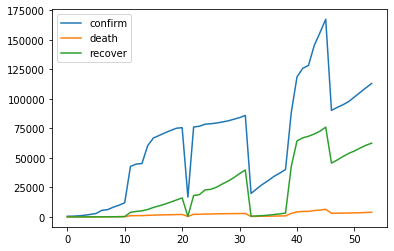

In [27]:
cmd=data.iloc[: , [4, 5,6,7]].copy() 

cmd.head()

cmd_grp =cmd.groupby("date")[['confirm', 'death', 'recover']].sum().reset_index()
cmd_grp.head()

cmd_grp.plot()


In [28]:
#confirm
prophet=cmd_grp.iloc[: , [0,1 ]].copy() 
prophet.head()
prophet.columns = ['ds','y']
prophet.head()


,ds,y
0,1/22/20,554
1,1/23/20,652
2,1/24/20,939
3,1/25/20,1432
4,1/26/20,2113


In [29]:
m=Prophet()
m.fit(prophet)
future=m.make_future_dataframe(periods=365)
forecast=m.predict(future)
forecast


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-01-22,-7.832802e+03,-1.951145e+04,9.954797e+02,-7.832802e+03,-7.832802e+03,-1082.775828,-1082.775828,-1082.775828,-1082.775828,-1082.775828,-1082.775828,0.0,0.0,0.0,-8.915578e+03
1,2020-01-23,-5.154477e+03,-1.606342e+04,5.259978e+03,-5.154477e+03,-5.154477e+03,-399.706144,-399.706144,-399.706144,-399.706144,-399.706144,-399.706144,0.0,0.0,0.0,-5.554183e+03
2,2020-01-24,-2.476152e+03,-1.137928e+04,9.356814e+03,-2.476152e+03,-2.476152e+03,1181.423000,1181.423000,1181.423000,1181.423000,1181.423000,1181.423000,0.0,0.0,0.0,-1.294729e+03
3,2020-01-25,2.021730e+02,-8.206190e+03,1.174887e+04,2.021730e+02,2.021730e+02,1658.738417,1658.738417,1658.738417,1658.738417,1658.738417,1658.738417,0.0,0.0,0.0,1.860911e+03
4,2020-01-26,2.880498e+03,-4.776592e+03,1.552449e+04,2.880498e+03,2.880498e+03,2469.183323,2469.183323,2469.183323,2469.183323,2469.183323,2469.183323,0.0,0.0,0.0,5.349681e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
414,2021-03-11,1.230275e+06,1.158460e+06,1.295081e+06,1.158669e+06,1.297522e+06,-399.706144,-399.706144,-399.706144,-399.706144,-399.706144,-399.706144,0.0,0.0,0.0,1.229876e+06
415,2021-03-12,1.233299e+06,1.161234e+06,1.302960e+06,1.161370e+06,1.300792e+06,1181.423000,1181.423000,1181.423000,1181.423000,1181.423000,1181.423000,0.0,0.0,0.0,1.234481e+06
416,2021-03-13,1.236323e+06,1.165939e+06,1.306787e+06,1.164046e+06,1.304063e+06,1658.738417,1658.738417,1658.738417,1658.738417,1658.738417,1658.738417,0.0,0.0,0.0,1.237982e+06
417,2021-03-14,1.239347e+06,1.170857e+06,1.310219e+06,1.166722e+06,1.307359e+06,2469.183323,2469.183323,2469.183323,2469.183323,2469.183323,2469.183323,0.0,0.0,0.0,1.241817e+06


<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                   D2.y   No. Observations:                   52
Model:                 ARIMA(1, 2, 1)   Log Likelihood                -590.241
Method:                       css-mle   S.D. of innovations          20572.328
Date:                Fri, 20 Mar 2020   AIC                           1188.481
Time:                        00:19:45   BIC                           1196.286
Sample:                             2   HQIC                          1191.474
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2161.3847   2479.783      0.872      0.383   -2698.900    7021.670
ar.L1.D2.y     0.1234      1.179      0.105      0.917      -2.188       2.435
ma.L1.D2.y    -0.2406      1.154     -0.208      0.835      -2.503       2.022
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            8.1051           +0.0000j            8.1051            0.0000
MA.1            4.1562           +0.0000j            4.1562            0.0000
-----------------------------------------------------------------------------
"""

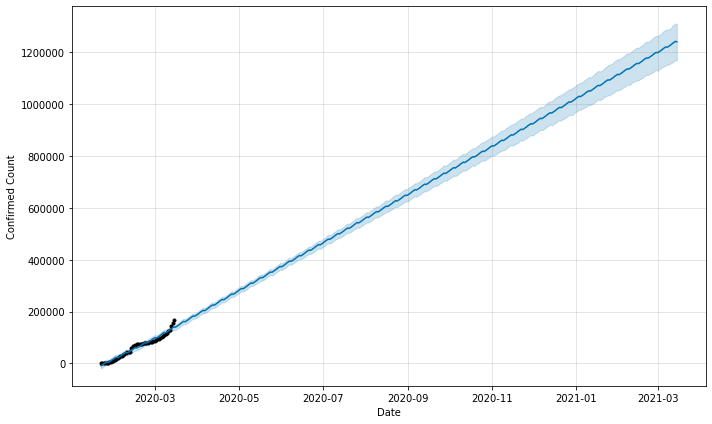

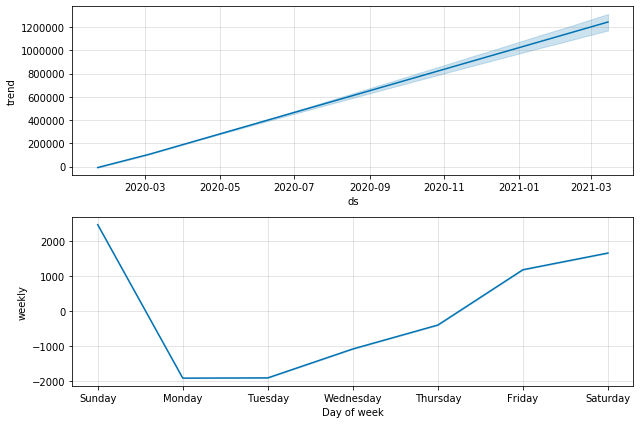

In [30]:
figure = m.plot(forecast,xlabel='Date',ylabel='Confirmed Count')


figure=m.plot_components(forecast)

#Autoregressive integrated moving average(Arima)
confirm_cs=cmd_grp.iloc[: , [0,1 ]].copy().cumsum()
confirm_cs
confirm_cs=confirm_cs.drop('date',axis=1)
confirm_cs['date']= prophet['ds']
confirm_cs
confirm_cs.columns = ['count','date']
arima_data=confirm_cs
arima_data.head()


model = ARIMA(arima_data['count'].values, order=(1, 2, 1))
fit_model = model.fit(trend='c', full_output=True, disp=True)
fit_model.summary()




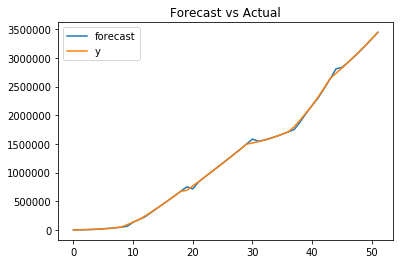

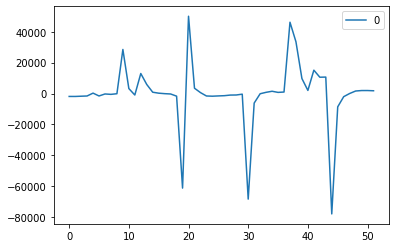

In [31]:

fit_model.plot_predict()
plt.title('Forecast vs Actual')
pd.DataFrame(fit_model.resid).plot()



In [32]:
forcast = fit_model.forecast(steps=12)
forecast
pred_y = forcast[1].tolist()
pred_y
confirm_pred = pd.DataFrame(pred_y)
confirm_pred.head()


,0
0,20572.328366
1,43857.384308
2,71600.309715
3,103273.154689
4,138471.734578


In [33]:
#For Recover Cases

prophet_rec=cmd_grp.iloc[: , [0,3 ]].copy() 
prophet_rec.head()
prophet_rec.columns = ['ds','y']
prophet_rec.head()


m1=Prophet()
m1.fit(prophet_rec)
future_rec=m1.make_future_dataframe(periods=365)
forecast_rec=m1.predict(future_rec)
forecast_rec


figure_rec = plot_plotly(m1, forecast_rec)
py.iplot(figure_rec) 


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                   D2.y   No. Observations:                   52
Model:                 ARIMA(1, 2, 1)   Log Likelihood                -552.270
Method:                       css-mle   S.D. of innovations           9912.926
Date:                Fri, 20 Mar 2020   AIC                           1112.541
Time:                        00:20:00   BIC                           1120.346
Sample:                             2   HQIC                          1115.533
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1201.0965   1470.729      0.817      0.414   -1681.480    4083.673
ar.L1.D2.y    -0.0244      1.395     -0.017      0.986      -2.758       2.709
ma.L1.D2.y     0.0973      1.386      0.070      0.944      -2.618       2.813
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1          -41.0252           +0.0000j           41.0252            0.5000
MA.1          -10.2756           +0.0000j           10.2756            0.5000
-----------------------------------------------------------------------------
"""

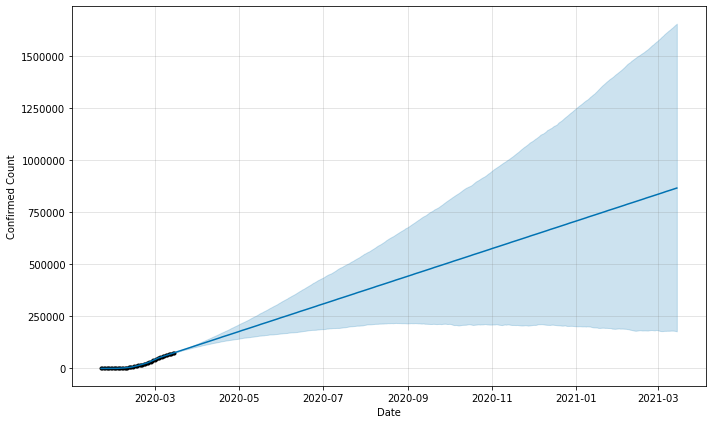

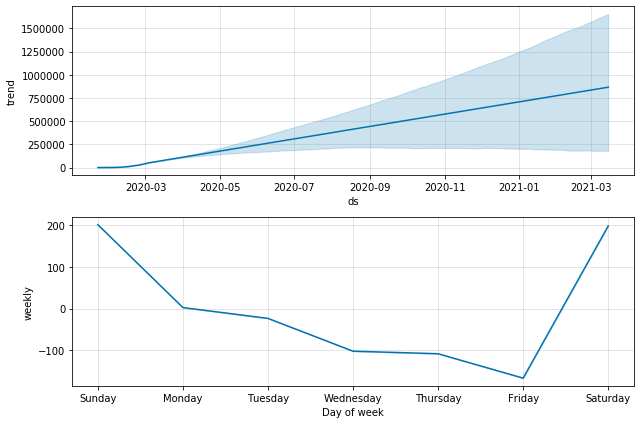

In [34]:
figure_rec = m1.plot(forecast_rec,xlabel='Date',ylabel='Confirmed Count')


figure_rec=m1.plot_components(forecast_rec)


confirm_cs_rec=cmd_grp.iloc[: , [0,3 ]].copy().cumsum()
confirm_cs_rec=confirm_cs_rec.drop('date',axis=1)
confirm_cs_rec['date']= prophet_rec['ds']
confirm_cs_rec
confirm_cs_rec.columns = ['count','date']
arima_data_rec=confirm_cs_rec
arima_data_rec.head()



model_rec = ARIMA(arima_data_rec['count'].values, order=(1, 2, 1))
fit_model_rec = model_rec.fit(trend='c', full_output=True, disp=True)
fit_model_rec.summary()



,0
0,9912.925616
1,22815.008600
2,38625.454988
3,56903.474541
4,77358.132366


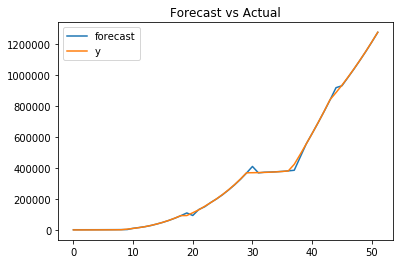

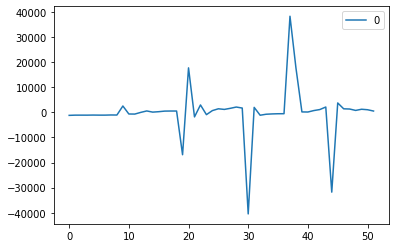

In [35]:
fit_model_rec.plot_predict()
plt.title('Forecast vs Actual')
pd.DataFrame(fit_model_rec.resid).plot()


forcast_rec = fit_model_rec.forecast(steps=12)
forecast_rec
pred_y_rec = forcast_rec[1].tolist()
recovery_pred=pd.DataFrame(pred_y_rec)
recovery_pred.head()


In [36]:
#For Death

prophet_dth=cmd_grp.iloc[: , [0,2 ]].copy() 
prophet_dth.head()
prophet_dth.columns = ['ds','y']
prophet_dth.head()


m2=Prophet()
m2.fit(prophet_dth)
future_dth=m2.make_future_dataframe(periods=365)
forecast_dth=m2.predict(future_dth)
forecast_dth



figure_dth = plot_plotly(m2, forecast_dth)
py.iplot(figure_dth) 



INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:                   D2.y   No. Observations:                   52
Model:                 ARIMA(1, 2, 1)   Log Likelihood                -420.292
Method:                       css-mle   S.D. of innovations            783.274
Date:                Fri, 20 Mar 2020   AIC                            848.584
Time:                        00:20:12   BIC                            856.389
Sample:                             2   HQIC                           851.576
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         75.7531    105.635      0.717      0.473    -131.288     282.795
ar.L1.D2.y    -0.7689      0.598     -1.286      0.199      -1.941       0.403
ma.L1.D2.y     0.7197      0.648      1.110      0.267      -0.551       1.990
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -1.3005           +0.0000j            1.3005            0.5000
MA.1           -1.3895           +0.0000j            1.3895            0.5000
-----------------------------------------------------------------------------
"""

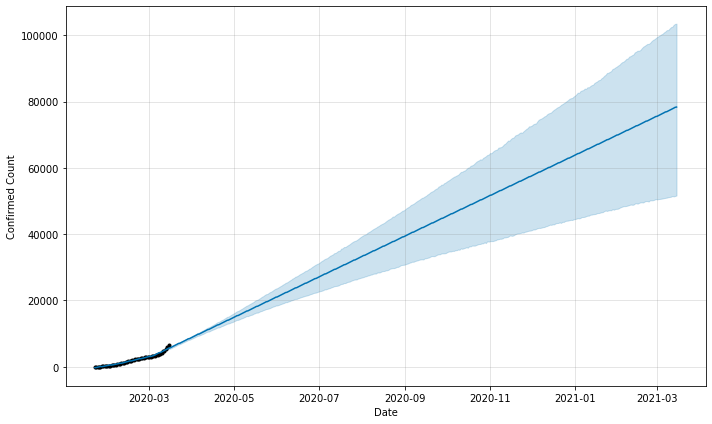

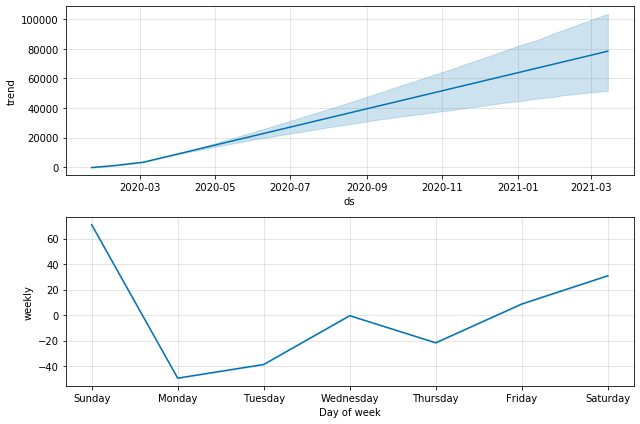

In [37]:
figure_dth = m2.plot(forecast_dth,xlabel='Date',ylabel='Confirmed Count')


figure_dth=m2.plot_components(forecast_dth)



confirm_cs_dth=cmd_grp.iloc[: , [0,2 ]].copy().cumsum()
confirm_cs_dth=confirm_cs_dth.drop('date',axis=1)
confirm_cs_dth['date']= prophet_dth['ds']
confirm_cs_dth
confirm_cs_dth.columns = ['count','date']
arima_data_dth=confirm_cs_dth
arima_data_dth.head()



model_dth = ARIMA(arima_data_dth['count'].values, order=(1, 2, 1))
fit_model_dth = model_dth.fit(trend='c', full_output=True, disp=True)
fit_model_dth.summary()



,0
0,783.274494
1,1717.041790
2,2872.106510
3,4192.286616
4,5673.666554


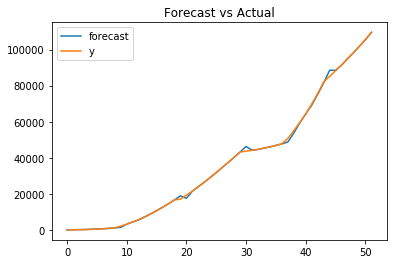

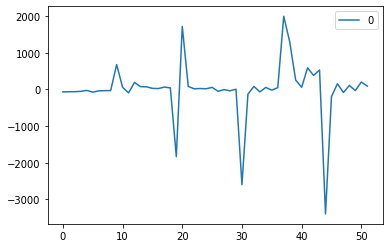

In [38]:
fit_model_dth.plot_predict()
plt.title('Forecast vs Actual')
pd.DataFrame(fit_model_dth.resid).plot()



forcast_dth = fit_model_dth.forecast(steps=12)
pred_y_dth = forcast_dth[1].tolist()
death_pred=pd.DataFrame(pred_y_dth)
death_pred.head()



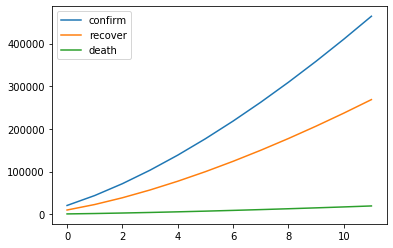

In [39]:

#Future Ratio

prediction = confirm_pred.iloc[: , [0 ]].copy() 
prediction['confirm'] = confirm_pred
prediction['recover'] = recovery_pred
prediction['death'] = death_pred
prediction = prediction.drop(0,axis=1)
prediction.head()


prediction.plot()


In [40]:

rtc=cmd_grp.recover.sum()/cmd_grp.confirm.sum()
print("Currently, the recovery percentage is " + str(rtc*100) )


frtc=prediction.recover.sum()/prediction.confirm.sum()
print("In future, the recovery percentage will be  " + str(frtc*100) )

dtc= cmd.death.sum()/cmd.confirm.sum()
print("Currently, the death percentage is  " + str(dtc*100) )

fdtc = prediction.death.sum()/prediction.confirm.sum()
print("In future, the death percentage will be " + str(fdtc*100) )


Currently, the recovery percentage is 37.127301026200286
In future, the recovery percentage will be  56.98834213022471
Currently, the death percentage is  3.180979954073089
In future, the death percentage will be 4.150221526969434
